In [125]:
#NECESSARY MODULES
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import pydot
from networkx.algorithms import bipartite
from networkx.algorithms import tournament

In [103]:
#READING THE DATA AND GRAPHING USING NETWORKX
df = pd.read_csv('ChG-Miner_miner-chem-gene.tsv', sep='\t')
G = nx.from_pandas_edgelist(df, source='#Drug', target='Gene', create_using=nx.DiGraph)
#Data pattern
print(df.head())
#GRAPH PROPERTIES
print("Number of nodes: ",G.number_of_nodes())
print("Number of edges: ",G.number_of_edges())
print("Is bipartite: ",nx.is_bipartite(G))

     #Drug    Gene
0  DB00357  P05108
1  DB02721  P00325
2  DB00773  P23219
3  DB07138  Q16539
4  DB08136  P24941
Number of nodes:  7343
Number of edges:  15139
Is bipartite:  True


In [104]:
#Prepare a bipartite layout
def prepare_bipartite(X):
    drug=[] 
    gene=[]
    colors = [] #Color different nodes
    for node in X:
        if node in df["#Drug"].values:
            colors.append("lightblue")
            drug.append(node)
        else:
            colors.append("lightgreen")
            gene.append(node)
    pos = {}
    # Update position for node from each group
    pos.update((node, (1, index)) for index, node in enumerate(drug))
    pos.update((node, (2, index)) for index, node in enumerate(gene))
    return pos,colors


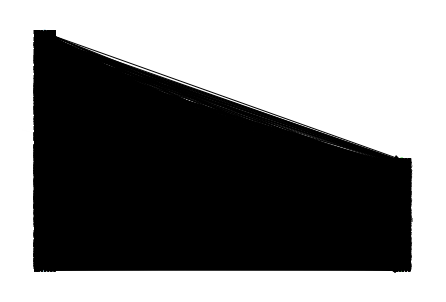

In [108]:
#Draw graph
pos,colors=prepare_bipartite(G)
nx.draw(G,pos,node_size=10,node_color=colors,with_labels=1,font_size=5)
plt.savefig("abc.pdf")
plt.show()

In [109]:
#Centrality Measures:
deg_centrality = nx.out_degree_centrality(G) 
#Drug with highest degree of centrality
max_degree_centrality_node,max_degree_centrality_value=(max(deg_centrality, key=deg_centrality.get),max(deg_centrality.values()))
print("Drug with highest degree of centrality",max_degree_centrality_node)


Drug with highest degree of centrality DB00157


In [110]:
neighbors_of_max_degree_centrality_node=[n for n in G.neighbors(max_degree_centrality_node)]
neighbors_of_max_degree_centrality_node.append(max_degree_centrality_node)
        

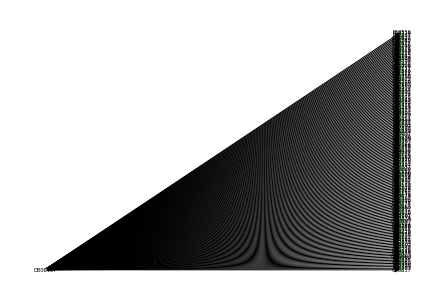

In [123]:
H=G.subgraph(neighbors_of_max_degree_centrality_node)
pos,colors=prepare_bipartite(H)
nx.draw(H,pos,node_size=10,node_color=colors,with_labels=1,font_size=5)

In [129]:
#Check if a Hamiltonian path exist
#A necessary condition for a graph to be Hamiltonian is the graph must be "strongly connected"
nx.is_strongly_connected(G)


False